# Imports

In [ ]:
!pip install pwlf
!pip install git+https://github.com/chasmani/piecewise-regression
!apt install imagemagick
!pip install dykstra

In [ ]:

from sklearn import linear_model
from scipy.optimize import curve_fit
from scipy.optimize import nnls
import cvxpy as cp
import numpy as np
import scipy as sp
# import dykstra 
import matplotlib.pyplot as plt
# import pwlf
import matplotlib.animation as animation
from matplotlib import rc

rc('animation', html='jshtml')

# Comsumption/Saving Problem w/ Concave fitted Value iteration, i.e., piecewise linear regression

In [ ]:
def get_max_cd(b, valuation, p, gamma, slopes, intercepts):
    allocation = cp.Variable(p.shape[0])
    saving = cp.Variable(1)
    
    obj = cp.Maximize(valuation.T @ cp.log(allocation) + gamma*(cp.min(slopes*saving+intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve()
    demand = allocation.value
    saving = saving.value

    return (util, demand, saving[0])


def get_max_linear(b, valuation, p, gamma, slopes, intercepts):
    allocation = cp.Variable(p.shape[0])
    saving = cp.Variable(1)
    
    obj = cp.Maximize(valuation.T @ allocation + gamma*(cp.min(slopes*saving+intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve()
    demand = allocation.value
    saving = saving.value

    return (util, demand, saving[0])

def get_max_leontief(b, valuation, p, gamma, slopes, intercepts):
    allocation = cp.Variable(p.shape[0])
    saving = cp.Variable(1)
    
    obj = cp.Maximize(cp.min(allocation / valuation) + gamma*(cp.min(slopes * saving + intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve()
    demand = allocation.value
    saving = saving.value

    return (util, demand, saving[0])


def single_buyer_val_iter(valuation, prices, gamma, slopes, intercepts, num_segments, num_iters, num_samples, utility_type):
    value_slopes_hist = []
    value_intercepts_hist = []
    values_hist = []

    saving_slopes_hist = []
    saving_intercepts_hist = []
    savings_hist = []

    budgets_hist = []

    if utility_type == "linear":
        get_max = get_max_linear
    elif utility_type == "leontief":
        get_max = get_max_leontief
    elif utility_type == "cd":
        get_max = get_max_cd

    value_slopes = slopes
    value_intercepts = intercepts
    value_slopes_hist.append(value_slopes)
    value_intercepts_hist.append(value_intercepts)
    
    for iter in range(num_iters):
        print(f"Iteration {iter}")
        values = []
        savings = []
        budgets = np.random.uniform(0,1, num_samples)


        for budget in budgets:
            util, demand, saving = get_max(budget, valuation, prices(budget), gamma, value_slopes, value_intercepts)
            values.append(util)
            savings.append(saving)
        
        value_my_pwlf = pwlf.PiecewiseLinFit(budgets, values)
        value_breaks = value_my_pwlf.fit(num_segments)
        value_slopes = value_my_pwlf.calc_slopes()
        value_intercepts = value_my_pwlf.intercepts

        value_slopes_hist.append(value_slopes)
        value_intercepts_hist.append(value_intercepts)
        values_hist.append(values)


        saving_my_pwlf = pwlf.PiecewiseLinFit(budgets, savings)
        saving_breaks = saving_my_pwlf.fit(num_segments)
        saving_slopes = saving_my_pwlf.calc_slopes()
        saving_intercepts = saving_my_pwlf.intercepts

        saving_slopes_hist.append(saving_slopes)
        saving_intercepts_hist.append(saving_intercepts)
        savings_hist.append(savings)

        budgets_hist.append(budgets)
    
    return (value_slopes_hist, value_intercepts_hist, values_hist, saving_slopes_hist, saving_intercepts_hist, savings_hist, budgets_hist)


## Examples with Different Utility Functions

In [ ]:
# Parameters of Computations

num_goods = 10
gamma = 0.8
slopes = np.array([2, -1, 4])
intercepts = np.array([2, -1, 4])
num_iters = 20
num_samples = 100
num_segments = 3

v = np.random.uniform(0,1, num_goods)
prices = lambda budget: 2*budget # Define a price policy

### Linear Example

In [ ]:

value_slopes_hist, value_intercepts_hist, values_hist, saving_slopes_hist, saving_intercepts_hist, savings_hist, budgets_hist = single_buyer_val_iter(v, prices, gamma, slopes, intercepts, num_segments, num_iters, num_samples, "linear")

Iteration 0
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19


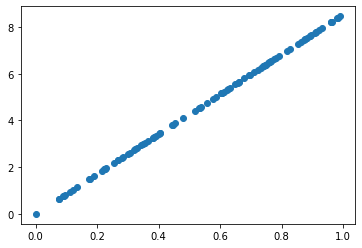

In [ ]:
plt.scatter(budgets_hist[-1], values_hist[-1])
plt.show()

#### Linear Value

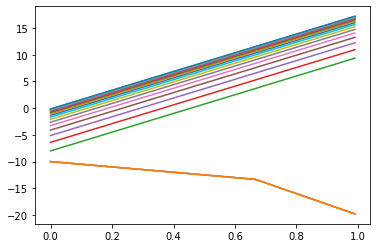

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

# print(np.minimum(slopes_hist[0][0]*x+intercepts_hist[0][0], slopes_hist[0][1]*x+intercepts_hist[0][1]))
def animate(i):
  comp = np.minimum(value_slopes_hist[i][0]*x + value_intercepts_hist[i][0], value_slopes_hist[i][1]*x + value_intercepts_hist[i][1])
  # print(comp)
  comp = np.minimum(comp, value_slopes_hist[i][2]*x + value_intercepts_hist[i][2])
  ax.plot(x, comp)
  # ax.plot(x, slopes_hist[i][1]*x+intercepts_hist[i][1])
  # ax.plot(x, slopes_hist[i][2]*x+intercepts_hist[i][2])

ani = animation.FuncAnimation(fig, animate, frames=num_iters, interval=100, repeat=False)

ani

#### Linear Saving

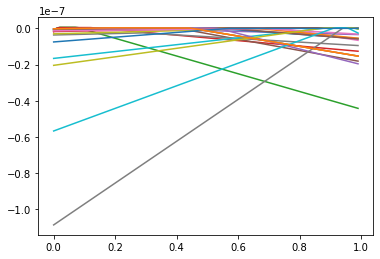

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

# print(np.minimum(slopes_hist[0][0]*x+intercepts_hist[0][0], slopes_hist[0][1]*x+intercepts_hist[0][1]))
def animate(i):
  comp = np.minimum(saving_slopes_hist[i][0]*x + saving_intercepts_hist[i][0], saving_slopes_hist[i][1]*x + saving_intercepts_hist[i][1])
  # print(comp)
  comp = np.minimum(comp, saving_slopes_hist[i][2]*x + saving_intercepts_hist[i][2])
  ax.plot(x, comp)
  # ax.plot(x, slopes_hist[i][1]*x+intercepts_hist[i][1])
  # ax.plot(x, slopes_hist[i][2]*x+intercepts_hist[i][2])

ani = animation.FuncAnimation(fig, animate, frames=num_iters, interval=100, repeat=False)

ani

### Cobb-Douglas Example

In [ ]:
value_slopes_hist, value_intercepts_hist, values_hist, saving_slopes_hist, saving_intercepts_hist, savings_hist, budgets_hist = single_buyer_val_iter(v, prices, gamma, slopes, intercepts, num_segments, num_iters, num_samples, "cd")

Iteration 0
Iteration 1


/usr/local/lib/python3.7/dist-packages/pwlf/pwlf.py:1090: RuntimeWarning: invalid value encountered in true_divide
  self.fit_breaks[:self.n_segments]))


Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19


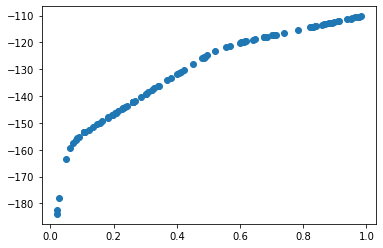

In [ ]:
x = np.arange(0, 1, 0.01)
plt.scatter(budgets_hist[-1], values_hist[-1])
plt.show()

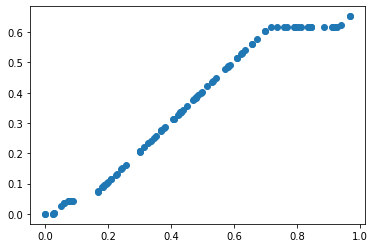

In [ ]:
plt.scatter(budgets_hist[-1], savings_hist[-1])
plt.show()

#### CD Value

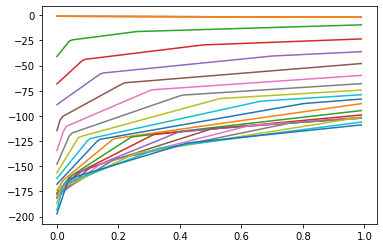

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

# print(np.minimum(slopes_hist[0][0]*x+intercepts_hist[0][0], slopes_hist[0][1]*x+intercepts_hist[0][1]))
def animate(i):
  comp = np.minimum(value_slopes_hist[i][0]*x + value_intercepts_hist[i][0], value_slopes_hist[i][1]*x + value_intercepts_hist[i][1])
  # print(comp)
  comp = np.minimum(comp, value_slopes_hist[i][2]*x + value_intercepts_hist[i][2])
  ax.plot(x, comp)
  # ax.plot(x, slopes_hist[i][1]*x+intercepts_hist[i][1])
  # ax.plot(x, slopes_hist[i][2]*x+intercepts_hist[i][2])

ani = animation.FuncAnimation(fig, animate, frames=num_iters, interval=100, repeat=False)

ani

#### CD Saving

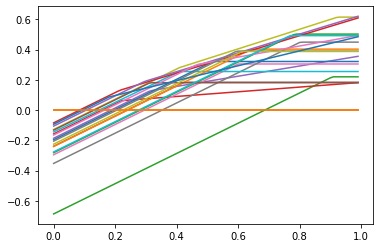

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

# print(np.minimum(slopes_hist[0][0]*x+intercepts_hist[0][0], slopes_hist[0][1]*x+intercepts_hist[0][1]))
def animate(i):
  comp = np.minimum(saving_slopes_hist[i][0]*x + saving_intercepts_hist[i][0], saving_slopes_hist[i][1]*x + saving_intercepts_hist[i][1])
  # print(comp)
  comp = np.minimum(comp, saving_slopes_hist[i][2]*x + saving_intercepts_hist[i][2])
  ax.plot(x, comp)
  # ax.plot(x, slopes_hist[i][1]*x+intercepts_hist[i][1])
  # ax.plot(x, slopes_hist[i][2]*x+intercepts_hist[i][2])

ani = animation.FuncAnimation(fig, animate, frames=num_iters, interval=100, repeat=False)

ani

### Leontief Example

In [ ]:
value_slopes_hist, value_intercepts_hist, values_hist, saving_slopes_hist, saving_intercepts_hist, savings_hist, budgets_hist = single_buyer_val_iter(v, prices, gamma, slopes, intercepts, num_segments, num_iters, num_samples, "leontief")

Iteration 0
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19
Iteration 20
Iteration 21
Iteration 22
Iteration 23
Iteration 24
Iteration 25
Iteration 26
Iteration 27
Iteration 28
Iteration 29
Iteration 30
Iteration 31
Iteration 32
Iteration 33
Iteration 34
Iteration 35
Iteration 36
Iteration 37
Iteration 38
Iteration 39
Iteration 40
Iteration 41
Iteration 42
Iteration 43
Iteration 44
Iteration 45
Iteration 46
Iteration 47
Iteration 48
Iteration 49


#### Leontief Value

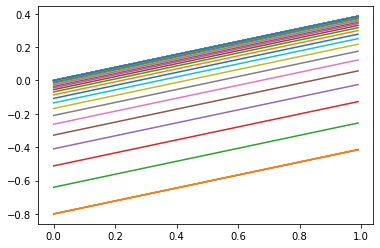

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

# print(np.minimum(slopes_hist[0][0]*x+intercepts_hist[0][0], slopes_hist[0][1]*x+intercepts_hist[0][1]))
def animate(i):
  comp = np.minimum(value_slopes_hist[i][0]*x + value_intercepts_hist[i][0], value_slopes_hist[i][1]*x + value_intercepts_hist[i][1])
  # print(comp)
  comp = np.minimum(comp, value_slopes_hist[i][2]*x + value_intercepts_hist[i][2])
  ax.plot(x, comp)
  # ax.plot(x, slopes_hist[i][1]*x+intercepts_hist[i][1])
  # ax.plot(x, slopes_hist[i][2]*x+intercepts_hist[i][2])

ani = animation.FuncAnimation(fig, animate, frames=num_iters, interval=100, repeat=False)

ani

#### Leontief Saving

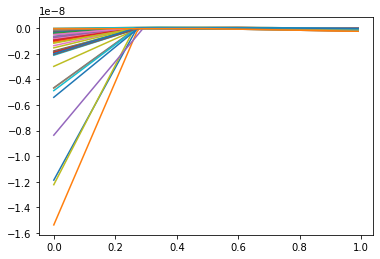

In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

# print(np.minimum(slopes_hist[0][0]*x+intercepts_hist[0][0], slopes_hist[0][1]*x+intercepts_hist[0][1]))
def animate(i):
  comp = np.minimum(saving_slopes_hist[i][0]*x + saving_intercepts_hist[i][0], saving_slopes_hist[i][1]*x + saving_intercepts_hist[i][1])
  # print(comp)
  comp = np.minimum(comp, saving_slopes_hist[i][2]*x + saving_intercepts_hist[i][2])
  ax.plot(x, comp)
  # ax.plot(x, slopes_hist[i][1]*x+intercepts_hist[i][1])
  # ax.plot(x, slopes_hist[i][2]*x+intercepts_hist[i][2])

ani = animation.FuncAnimation(fig, animate, frames=num_iters, interval=100, repeat=False)

ani

# Dynamic Fisher Market w/ linear Fitted Value Iteration

#### Utilities

In [ ]:

################### Utility Functions ##########################

def get_linear_util(demands, valuations):
    return np.sum(demands * valuations, axis = 1) 


def get_leontief_util(demands, valuations):
    return np.min(demands/valuations.clip(min = 0.001), axis = 1)


def get_cd_util(demands, valuations):
    return np.sum(np.log(demands.clip(min = 0.001))*valuations, axis = 1) 


#################### Utility Gradient Functions #####################
def get_linear_util_gradient(allocations, valuations):
    return valuations

def get_leontief_util_gradient(allocations, valuations):
    grad_matrix = []
    argmins = np.argmin(allocations/valuations.clip(min = 0.001), axis = 0)
    marginal_utils = np.zeros(allocations.shape)
    
    for buyer in range(allocations.shape[0]):
      marginal_utils[buyer, argmins[buyer] ] = 1 / valuations[buyer, argmins[buyer]].clip(min = 0.001)
    
    return marginal_utils

def get_cd_util_gradient(allocations, valuations):
    # return ( np.prod(np.power(allocations, valuations), axis = 1)*( valuations / allocations.clip(min = 0.001) ).T).T
    return ( valuations / allocations.clip(min = 0.001) )
################### Projection Onto Budget Set ##########################


def project_onto_half_space(X, beta, p, b):
  offsets = ((X @ p + beta - b).clip(min= 0))/(np.linalg.norm(p)**2).clip(min= 10e-5)

  X_proj = X - (offsets*np.tile(p, reps = (b.shape[0], 1)).T).T
  beta_proj = beta - offsets
  
  return (X_proj, beta_proj)


def project_onto_positive_ortanth(X, beta, p, b):

  return (X.clip(min = 0), beta.clip(min = 0))

def project_to_bugdet_set(X, beta, p, b):
  iter = 0
  P_X, P_beta = np.zeros(X.shape), np.zeros(b.shape[0])
  Q_X, Q_beta = np.zeros(X.shape), np.zeros(b.shape[0])
  X_proj_y, beta_proj_y = X, beta
  X_proj_x, beta_proj_x = np.ones(X.shape), np.ones(b.shape[0])
  
  X_proj_prev, beta_proj_prev = X.copy(), beta.copy()
  change = float("inf")
  iter = 0
  while np.any(X_proj_x @ p + beta_proj_x - b >  10e-4) or np.any(X_proj_x < 0) or np.any(beta_proj_x < 0) :
  # while iter <= 1000:
    iter += 1
    # print("iterations", iter, "error: ", change)
    X_proj_x, beta_proj_x = project_onto_positive_ortanth(X_proj_y + P_X, beta_proj_y + P_beta, p, b)
    # print("proj", X_proj_x, beta_proj_x)
    P_X, P_beta = (P_X + X_proj_y - X_proj_x, P_beta + beta_proj_y - beta_proj_x)
    X_proj_y, beta_proj_y = project_onto_half_space(X_proj_x + Q_X, beta_proj_x + Q_beta, p, b)
    Q_X, Q_beta = Q_X + X_proj_x - X_proj_y, Q_beta + beta_proj_x- beta_proj_y
    
    change = np.linalg.norm(X_proj_prev - X_proj_x) + np.linalg.norm(beta_proj_prev - beta_proj_x)
    X_proj_prev, beta_proj_prev = X_proj_x.copy(), beta_proj_x.copy()
  
  assert np.all(X_proj_x @ p + beta_proj_x - b <=  10e-2) and np.all(X_proj_x >= 0) and np.all(beta_proj_x >= 0) 
  # print("proj", X_proj_x, beta_proj_x)
  return X_proj_x, beta_proj_x
  # shadow_demands = np.zeros((X.shape[0], X.shape[1] + 1))
  # shadow_prices = np.zeros(X.shape[1] + 1)
  # shadow_demands[:, :-1] = X 
  # shadow_demands[:, -1] = beta

  # shadow_prices[:-1] = p
  # shadow_prices[-1] = 1
  
  # P, Q = np.zeros((X.shape[0], X.shape[1] + 1))
  # (1/np.linalg.norm(shadow_prices)**2).clip(min= 0.00000001)*((shadow_demands @ shadow_prices - b).clip(min= 0)* np.tile(shadow_prices, reps = (b.shape[0], 1)).T).T
  # while (np.linalg.norm((shadow_demands @   shadow_prices - b).clip(min = 0)) < 1):
      
  #     shadow_demands -= (1/np.linalg.norm(shadow_prices)**2).clip(min= 0.00000001)*((shadow_demands @ shadow_prices - b).clip(min= 0)* np.tile(shadow_prices, reps = (b.shape[0], 1)).T).T
  #     shadow_demands = shadow_demands.clip(min = 0)
      
  
  
  # return (shadow_demands[:, :-1], shadow_demands[:, -1])

################### Min-Max Objective Functions ##########################

def get_linear_obj(prices, demands, budgets, valuations):
  utils = np.sum(valuations * demands, axis = 1)
  return np.sum(prices) + budgets @ np.log(utils.clip(min=0.0001))


def get_leontief_obj(prices, demands, budgets, valuations):
    utils = np.min(demands/valuations, axis = 1)
    return np.sum(prices) + budgets @ np.log(utils.clip(min=0.0001))


def get_cd_obj(prices, demands, budgets, valuations):
    utils = np.prod(np.power(demands, valuations), axis= 1)
    return np.sum(prices) + budgets @ np.log(utils.clip(min=0.0001))


################### Heuristic objective function ##########################
def get_global(X, get_obj, prices, budgets, valuations, value_coef, value_intercept):
  num_buyers = budgets.shape[0]
  num_goods = prices.shape[0]
  X = X.reshape((num_buyers, num_goods + 1))
  
  demands = X[:, :-1]
  savings = X[:, -1]
  demands = demands.clip(min = 0.0001)
  savings = savings.clip(min = 0.0001)
  
  return -(get_obj(prices, demands, budgets-savings, valuations) + discount*(value_coef.T @ savings + value_intercept) )

#### Get_Max

In [ ]:
def get_max_linear(b, valuation, p, gamma, slopes, intercepts):
    allocation = cp.Variable(p.shape[0])
    saving = cp.Variable()
    
    obj = cp.Maximize(valuation.T @ allocation + gamma*(cp.min(slopes*saving+intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve()
    demand = allocation.value
    saving = saving.value

    return (util, demand, saving)

def get_max_leontief(b, valuation, p, gamma, slopes, intercepts):
    allocation = cp.Variable(p.shape[0])
    saving = cp.Variable()
    
    obj = cp.Maximize(cp.min(allocation / valuation) + gamma*(cp.min(slopes * saving + intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve()
    demand = allocation.value
    saving = saving.value

    return (util, demand, saving)


def get_max_cd(b, valuation, p, gamma, slopes, intercepts):
    allocation = cp.Variable(p.shape[0])
    saving = cp.Variable()
    
    obj = cp.Maximize(valuation.T @ cp.log(allocation) + gamma*(cp.min(slopes*saving+intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve()
    demand = allocation.value
    saving = saving.value

    return (util, demand, saving)

#### Get optimal value function for single buyer

In [ ]:

# Value iteration on single buyer to get optimal value function
def get_optimal_value_function_singlebuyer(valuation, p, gamma, slopes, intercepts, num_iters, num_samples, utility_type):

    global error_count

    if utility_type == "linear":
        get_max = get_max_linear
    elif utility_type == "leontief":
        get_max = get_max_leontief
    elif utility_type == "cd":
        get_max = get_max_cd


    # Initialize the convex program get_max
    allocation = cp.Variable(p.shape)
    saving = cp.Variable()
    b = cp.Parameter(nonneg=True)
    value_slopes = cp.Parameter(3)
    value_intercepts = cp.Parameter(3)

    linear_obj = cp.Maximize(valuation.T @ allocation + gamma*(cp.min(value_slopes*saving + value_intercepts)))
    leontief_obj = cp.Maximize(cp.min(allocation / valuation) + gamma*(cp.min(value_slopes*saving + value_intercepts)))
    cd_obj = cp.Maximize(valuation.T @ cp.log(allocation) + gamma*(cp.min(value_slopes*saving + value_intercepts)))
    constr = [allocation.T @ p  + saving <= b,
                allocation >= 0,
                saving >= 0]
    if utility_type == "linear":
        obj = linear_obj
    elif utility_type == "leontief":
        obj = leontief_obj
    elif utility_type == "cd":
        obj = cd_obj
    prob = cp.Problem(obj, constr)


    value_slopes.value = slopes
    value_intercepts.value = intercepts

    # value_slopes = slopes
    # value_intercepts = intercepts

    # Start the value iteration
    for iter in range(num_iters):
        if iter % 10 == 0:
            print(f"Iteration {iter}/{num_iters}")

        values = []
        budgets = np.random.uniform(0,1, num_samples)

        for budget in budgets:
            # Solve the convex program repeatedly
            b.value = budget
            try:
              util = prob.solve(solver="ECOS")
            except cp.SolverError:
              error_count = error_count + 1
              print(f"There is an ERROR!! It's the NO. {error_count} error!")

            # util, demand, saving = get_max(budget, valuation, p, discount, value_slopes, value_intercepts)
            values.append(util)
        
        value_my_pwlf = pwlf.PiecewiseLinFit(budgets, values)
        value_breaks = value_my_pwlf.fit(3)
        value_slopes.value = value_my_pwlf.calc_slopes()
        value_intercepts.value = value_my_pwlf.intercepts

    
    return value_slopes.value, value_intercepts.value

#### Get max convex program for whole market

In [ ]:
from cvxpy.settings import P
def get_max_linear_wholemarket(budgets, valuations, p, gamma, value_coef, value_intercept):
    allocations = cp.Variable(valuations.shape)
    savings = cp.Variable(valuations.shape[0])
    
    util = cp.sum(cp.multiply(valuations, allocations), axis=1) # Matrix elementwise product here
    obj = cp.Maximize(cp.sum(p) + budgets @ cp.log(util) + gamma*(savings.T @ value_coef + value_intercept))
    constr = [allocations @ p  + savings <= budgets,
                allocations >= 0.001,
                cp.sum(cp.multiply(valuations, allocations)) >= 0.001,
                savings >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve(solver=cp.ECOS, verbose=True)
    demands = allocations.value
    savings = savings.value

    # print("obj:", util)
    # print("prices:", p)
    # print("demands:", demands)
    # print("savings:", savings)
    # print("budgets:", budgets)
    # print("coef, intercept", value_coef, value_intercept)
    # print(savings.T @ value_coef + value_intercept)
    # print("---------------------------------------------------------------")

    return (util, demands, savings)



def get_max_leontief_wholemarket(budgets, valuations, p, gamma, value_coef, value_intercept):
    allocations = cp.Variable(valuations.shape)
    savings = cp.Variable(valuations.shape[0])

    util = cp.min(allocations/valuations, axis = 1)
    obj = cp.Maximize(cp.sum(p) + budgets @ cp.log(util) + gamma*(savings.T @ value_coef + value_intercept))
    constr = [allocations @ p  + savings <= budgets,
                allocations >= 0,
                savings >= 0]
    program = cp.Problem(obj, constr)

    util = program.solve(solver=cp.ECOS_BB)
    demands = allocations.value
    savings = savings.value
    return (util, demands, savings)




def get_max_cd_wholemarket(budgets, valuations, p, gamma, value_coef, value_intercept):
    allocations = cp.Variable(valuations.shape)
    savings = cp.Variable(valuations.shape[0])
    # Problem identified: allocation is too small, so cp.log(allocations) is always negative -> util is always negative
    util = cp.sum(cp.multiply(valuations, cp.log(allocations)), axis=1) # Matrix elementwise product here
    obj = cp.Maximize(cp.sum(p) + budgets @ cp.log(util) + gamma*(savings.T @ value_coef + value_intercept))
    constr = [allocations @ p  + savings <= budgets,
                allocations >= 0.001,
                cp.sum(cp.multiply(valuations, cp.log(allocations)), axis=1) >= 0.001,
                savings >= 0.0001]
    program = cp.Problem(obj, constr)

    util = program.solve(solver=cp.ECOS, verbose=True)
    demands = allocations.value
    savings = savings.value

    print("obj:", util)
    print("prices:", p)
    print("demands:", demands)
    print("savings:", savings)
    print("budgets:", budgets)
    print("coef, intercept", value_coef, value_intercept)
    print(savings.T @ value_coef + value_intercept)
    print("---------------------------------------------------------------")
    return (util, demands, savings)


## Helper Functions

In [ ]:
def get_greedy_action(budgets, valuations, utility_type, value_coef, value_intercept, discount, 
                      learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands):

  value, prices, allocations, savings = min_max_linear_value(budgets, valuations, value_coef, value_intercept, discount, 
                                                             learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, 
                                                             utility_type)

  return (prices, allocations, savings)


def get_buyers_cumulative_util(init_budgets, valuations, utility_type, value_coef, value_intercept, discount, learn_rate_prices, 
                               learn_rate_demands, num_iters_prices, num_iters_demands, num_iters):
  
  if utility_type == "linear":
      get_util = get_linear_util
  
  elif utility_type == "leontief":
      get_util = get_leontief_util
  
  elif utility_type == "cd":
      get_util = get_cd_util
  
  cumul_utils = np.zeros(num_buyers)
  budgets = init_budgets   
  for iter in range(1, num_iters):
    prices, allocations, savings = get_greedy_action(budgets, valuations, utility_type, value_coef, value_intercept, discount, 
                                                     learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands)
    if iter==1:
      start_prices = prices
    cumul_utils += (discount**iter)*get_util(allocations, valuations)
    budgets = savings

  return start_prices, cumul_utils


## Nested Gradient Descent Ascent based Solution

#### Min_Max step

In [ ]:
# Min Max q function with linearly approximated value functions

def min_max_linear_value(budgets, valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                         num_iters_prices, num_iters_demands, utility_type):
  prices = np.zeros(valuations.shape[1]).clip(min=0.1)
  print(f"valuations: {valuations}")
  if utility_type == "linear":
      get_util = get_linear_util
      get_marginal_util = get_linear_util_gradient
      get_obj = get_linear_obj

  elif utility_type == "leontief":
      get_util = get_leontief_util
      get_marginal_util = get_leontief_util_gradient
      get_obj = get_leontief_obj

  elif utility_type == "cd":
      get_util = get_cd_util
      get_marginal_util = get_cd_util_gradient
      get_obj = get_cd_obj
      

  num_buyers = budgets.shape[0]
  num_goods = prices.shape[0]
  
  allocation = cp.Variable((num_buyers, num_goods))
  saving = cp.Variable(num_buyers)
  p = cp.Parameter(num_goods)
  b = cp.Parameter(num_buyers)  
  beta = cp.Parameter(num_buyers) 
  X = cp.Parameter((num_buyers, num_goods))

  obj = cp.Minimize( cp.sum(cp.power(cp.norm(X - allocation, axis = 1), 2)) + cp.sum(cp.power(saving - beta, 2)))
  constr = [allocation @ p  + saving <= b,
              allocation >= 0,
              saving >= 0] 
  
  
  # Gradient Descent loop
  for iter_outer in range(1, num_iters_prices):
   
    demands = np.zeros((num_buyers, num_goods)).clip(min = 1)
    savings = np.zeros(num_buyers).cl ip(min = 1)
    # Gradient Ascent loop
  
    for iter_inner in range(1, num_iters_demands):

      utils = get_util(demands, valuations).clip(min = 0.00001)
      marginals = get_marginal_util(demands, valuations)
      spendings = budgets - savings
      

      # Demand step
      demands_step = (((spendings/utils)*marginals.T)).T
      demands += learn_rate_demands*demands_step
      
      # Saving step
      # savings += learn_rate_demands*( - np.log(utils) + discount*value_coef)
      savings += learn_rate_demands*(  discount*value_coef)
      
      # Projection step
      p.value = prices
      b.value = budgets
      beta.value = savings
      X.value = demands

      problem = cp.Problem(obj, constr)
      problem.solve(warm_start=True)
      # print("problem status", problem.status)
      demands, savings = allocation.value, saving.value
      # demands, savings = project_to_bugdet_set(demands, savings, prices, budgets)
     

    assert np.all(demands @ prices + savings <= budgets + 10e-2)
    # print("before update prices:",prices)
    excess_demands = np.sum(demands, axis = 0) - np.ones(num_goods)
    if np.linalg.norm(excess_demands)**2 < 10e-2:
      print("Early end! Excess demand norm:", np.linalg.norm(excess_demands)**2)
    if not(iter_outer % 10):
      print(f"\n****Min-Max Price Iteration {iter_outer}****")
      print(f"Prices:\n {prices}")
      print("demands:", demands)
      print("savings:", savings)
      print("budgets:", budgets)
      print(f"Excess Demands\n {excess_demands}")
    # print("excess_demands:", excess_demands)
    prices += (iter_outer**(-1/2))*learn_rate_prices * excess_demands/(np.linalg.norm(excess_demands) + 10e-7)
    
    # prices *= np.exp(learn_rate_prices*excess_demands/np.linalg.norm(excess_demands))
    # prices /= np.sum(budgets - savings)
    prices = np.clip(prices, a_min=0.001, a_max = None)
    # print("after update prices:",prices)
    # print("savings", savings)
  
  for iter_inner in range(1, num_iters_demands):

      utils = get_util(demands, valuations).clip(min = 0.00001)
      marginals = get_marginal_util(demands, valuations)
      spendings = budgets - savings
      

      # Demand step
      demands += learn_rate_demands*((((spendings/utils)*marginals.T)).T)
      
      # Saving step
      savings += learn_rate_demands*( - np.log(utils) + discount*value_coef)
      savings += learn_rate_demands*(discount*value_coef)

      # Projection step
      demands, savings = project_to_bugdet_set(demands, savings, prices, budgets)

  print(f"Demands:\n{demands}")
  print(f"Prices:\n {prices}")
  print(f"Savings:\n {savings}")
  print(f"actual spending\n {demands @ prices}")
  print(f"spending\n {spendings}")
  value = get_obj(prices, demands, budgets-savings, valuations) + discount*(savings.T @ value_coef + value_intercept)
  return value, prices, demands, savings

# #################### SECOND ####################

# def min_max_linear_value(budgets, valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
#                          num_iters_prices, num_iters_demands, utility_type):
#   prices = np.zeros(valuations.shape[1]).clip(min=1/np.sum(budgets))
#   prices_hist = []
#   print(f"valuations: {valuations}")
 
#   num_buyers = budgets.shape[0]
#   num_goods = prices.shape[0]
  
  
#   X = cp.Variable((num_buyers, num_goods))
#   beta = cp.Variable(num_buyers)
#   # V = cp.Parameter((num_buyers, num_goods))
#   p = cp.Parameter(num_goods)
#   # b = cp.Parameter(num_buyers)
 
#   if utility_type == "linear":
#       get_util = get_linear_util
#       get_marginal_util = get_linear_util_gradient
#       get_obj = get_linear_obj
#       utils = cp.sum(cp.multiply(X, valuations), axis =1)

#   elif utility_type == "leontief":
#       get_util = get_leontief_util
#       get_marginal_util = get_leontief_util_gradient
#       get_obj = get_leontief_obj
#       utils = cp.min(X/valuations, axis = 1)

#   elif utility_type == "cd":
#       get_util = get_cd_util
#       get_marginal_util = get_cd_util_gradient
#       get_obj = get_cd_obj
#       utils = cp.sum(cp.multiply(X, cp.log(valuations)), axis =1)
      


#   obj = cp.Maximize(budgets.T @ cp.log(utils) + discount*(value_coef*beta+value_intercept))
#   constr = [  X @ p  + beta <= budgets,
#               X >= 0,
#               beta >= 0]

#   # Gradient Descent loop
#   for iter_outer in range(1, num_iters_prices):
#     if not(iter_outer % 50):
#       print(f"Min-Max Price Iteration {iter_outer}\n")
#       print(f"Prices:\n {prices}")
#       print(f"Excess Demands\n {excess_demands}")
#       print(f"actual spending\n {demands @ prices}")
#       print(f"spending\n {budgets - savings}")
  
    
#     p.value = prices
    
#     problem = cp.Problem(obj, constr)
#     try:
#       util = problem.solve(warm_start=True)
#     except cp.SolverError:
#       util = problem.solve(warm_start=True, solver="SCS")

#     demands, savings = X.value.clip(min = 10e-6), beta.value.clip(min = 10e-6)
   
#     excess_demands = np.sum(demands, axis = 0) - np.ones(num_goods)
#     prices += (iter_outer**(-1/2))*learn_rate_prices*excess_demands/np.linalg.norm(excess_demands)
#     # prices /= np.sum(budgets - savings)  
#     prices = np.clip(prices, a_min=0.000001, a_max = None)

#     prices_hist.append(prices)

  
#   p.value = prices
  
#   problem = cp.Problem(obj, constr)
#   try:
#     util = problem.solve(warm_start=True)
#   except cp.SolverError:
#     util = problem.solve(warm_start=True, solver="SCS")

#   demands, savings = X.value.clip(min = 10e-6), beta.value.clip(min = 10e-6)
  
#   print(f"Prices:\n {prices}")
#   print(f"Excess Demands\n {excess_demands}")
#   print(f"Savings:\n {savings}")
#   print(f"actual spending\n {demands @ prices}")
#   print(f"spending\n {budgets - savings}")
  
#   value = get_obj(prices, demands, budgets-savings, valuations) + discount*(savings.T @ value_coef + value_intercept)
#   return value, prices, demands, savings


#### Value Iteration

In [ ]:

# The main function for value iteration
def fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
                                                                    num_iters_VI, num_iters_prices,  num_iters_demands, 
                                                                    num_samples, utility_type):
    coef_hist = [value_coef]
    intercept_hist = [value_intercept]
    values_hist = []
    budgets_hist = []
    
    num_buyers = valuations.shape[0]
    num_goods = valuations.shape[1]

    budgets_samples = np.random.uniform(0, 1, (num_samples, num_buyers))
    for iter in range(num_iters_VI):
        print(f"----------Iteration {iter}------------")
        values = []
        
        for index, budgets in enumerate(budgets_samples): 
            print(f"_____Sample {index}_____")
            value, prices, allocations, savings = min_max_linear_value(budgets, valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, utility_type)
            values.append(value)
        
        values = np.array(values)
        

        reg = linear_model.LinearRegression()
        reg.fit(budgets_samples, values)
        value_coef = reg.coef_ # Update the parameters
        value_intercept = reg.intercept_ # Update the intercept
        
        coef_hist.append(value_coef)
        intercept_hist.append(value_intercept)
        values_hist.append(values)
        budgets_hist.append(budgets_samples)

        # coef_hist_filename = f"/content/drive/My Drive/exp_results/coef_hist_{iter}_cd_fisher.npy"
        # intercept_hist_filename = f"/content/drive/My Drive/exp_results/intercept_hist_{iter}_cd_fisher.npy"
        # values_hist_filename = f"/content/drive/My Drive/exp_results/values_hist_{iter}_cd_fisher.npy"
        # budgets_hist_filename = f"/content/drive/My Drive/exp_results/budgets_hist_{iter}_cd_fisher.npy"
        # with open(coef_hist_filename, 'wb') as f:
        #     np.save(f, coef_hist)

        # with open(intercept_hist_filename, 'wb') as f:
        #     np.save(f, intercept_hist)

        # with open(values_hist_filename, 'wb') as f:
        #     np.save(f, values_hist)


        # with open(budgets_hist_filename, 'wb') as f:
        #     np.save(f, budgets_hist)

    return (coef_hist, intercept_hist, values_hist, budgets_hist)


### Experiments

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

num_goods = 5
num_buyers = 2
discount = 0.9
value_coef = np.repeat(1, num_buyers)
value_intercept = 10


valuations = np.random.uniform(50,10, (num_buyers, num_goods))

learn_rate_prices = 0.5
learn_rate_demands = 0.8
num_iters_VI = 20
num_iters_prices = 30 #10
num_iters_demands = 100 #20
num_samples = 25 #25



# coef_hist_linear, intercept_hist_linear, values_hist_linear, budgets_hist_linear = fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
#                                                                     num_iters_VI, num_iters_prices, num_iters_demands, 
#                                                                     num_samples, "linear")

# coef_hist_leontief, intercept_hist_leontief, values_hist_leontief, budgets_hist_leontief = fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
#                                                                     num_iters_VI, num_iters_prices, num_iters_demands, 
#                                                                     num_samples, "leontief")

coef_hist_cd, intercept_hist_cd, values_hist_cd, budgets_hist_cd = fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                                                                    num_iters_VI, num_iters_prices, num_iters_demands, 
                                                                    num_samples, "cd")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
----------Iteration 0------------
_____Sample 0_____
valuations: [[22.10499372 47.088635   35.23591358 46.49218116 25.91063791]
 [38.87242757 29.97489382 42.3153596  42.81001246 25.01731152]]
demands brute [[1.56222345e-11 8.47294698e-12 5.44220949e-12 2.11736965e-11
  8.62574382e-11]
 [5.17863446e-02 5.50044156e-02 8.23694966e-12 6.47810474e-02
  8.11022641e-11]]
savings [0.11068846 0.1625129 ]

**Min-Max Price Iteration 1**
Prices:
 [1.52647724 1.52722207 1.51449115 1.5294849  1.51449115]
Excess Demands
 [-0.94821366 -0.94499558 -1.         -0.93521895 -1.        ]
actual spending
 [2.08050211e-10 2.62136268e-01]
spending
 [2.44880879e-10 2.99554744e-01]
demands brute [[1.10277160e-11 5.01624315e-10 1.29220680e-11 5.98752855e-11
  8.29255962e-12]
 [6.59641953e-03 7.91051923e-02 3.20411256e-11 1.05818803e-10
  9.75251800e-02]]
savings [0.11068846 0.18348614]

KeyboardInterrupt: ignored

In [ ]:
value_coef = coef_hist_cd[-1]
value_intercept = intercept_hist_cd[-1]
print(value_coef)
print(value_intercept)

[ -8.56211354 -12.83777661]
830.4895453848118


#### Save results

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


##### Save Linear data ##### 

# with open('/content/drive/My Drive/exp_results/coef_hist_linear_fisher.npy', 'wb') as f:
#     np.save(f, coef_hist_linear)

# with open('/content/drive/My Drive/exp_results/intercept_hist_linear_fisher.npy', 'wb') as f:
#     np.save(f, intercept_hist_linear)

# with open('/content/drive/My Drive/exp_results/values_hist_linear_fisher.npy', 'wb') as f:
#     np.save(f, values_hist_linear)

# with open('/content/drive/My Drive/exp_results/budgets_hist_linear_fisher.npy', 'wb') as f:
#     np.save(f, budgets_hist_linear)


##### Save Cobb-Douglas data #####
with open('/content/drive/My Drive/exp_results_cd/coef_hist_cd_fisher.npy', 'wb') as f:
    np.save(f, coef_hist_cd)

with open('/content/drive/My Drive/exp_results_cd/intercept_hist_cd_fisher.npy', 'wb') as f:
    np.save(f, intercept_hist_cd)

with open('/content/drive/My Drive/exp_results_cd/values_hist_cd_fisher.npy', 'wb') as f:
    np.save(f, values_hist_cd)


# ##### Save Leontief data ##### 
# with open('/content/drive/My Drive/exp_results/budgets_hist_cd_fisher.npy', 'wb') as f:
#     np.save(f, budgets_hist_cd)

# with open('/content/drive/My Drive/exp_results/coef_hist_leontief_fisher.npy', 'wb') as f:
#     np.save(f, coef_hist_leontief)

# with open('/content/drive/My Drive/exp_results/intercept_hist_leontief_fisher.npy', 'wb') as f:
#     np.save(f, intercept_hist_leontief)

# with open('/content/drive/My Drive/exp_results/values_hist_leontief_fisher.npy', 'wb') as f:
#     np.save(f, values_hist_leontief)

# with open('/content/drive/My Drive/exp_results/budgets_hist_leontief_fisher.npy', 'wb') as f:
#     np.save(f, budgets_hist_leontief)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Animations of Change in Value Function

##### Linear

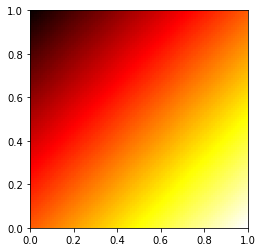

In [ ]:
# print(coef_hist)
# print(intercept_hist)

fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

def animate(i):
  heatmap = np.zeros((x.shape[0], x.shape[0]))
  for j, val_j in enumerate(x):
    for k, val_k in enumerate(x):
      # heatmap[j,k] = params_hist[i][0]*val_j + params_hist[i][1]*val_k
      heatmap[j,k] = coef_hist_linear[i][0]*val_j + coef_hist_linear[i][1]*val_k + intercept_hist_linear[i]
      # budgets = np.array([val_j, val_k])
      # heatmap[j,k] = budgets.T @ coef_hist[i] + intercept_hist[i]
  
  
  im = ax.imshow(heatmap, cmap='hot', interpolation='nearest', extent = [0 , 1, 0 , 1])


ani = animation.FuncAnimation(fig, animate, frames=num_iters_VI, interval=500, repeat=False)

# ani.save('/content/drive/My Drive/exp_results/linear_value_fisher.gif', writer='imagemagick', fps=5)

ani

##### Cobb-Douglas

In [ ]:
for i in range(num_iters_VI):
  print(coef_hist_cd[i][0]*14.141 + coef_hist_cd[i][1]*11 + intercept_hist_cd[i])



35.141
14.625986364365133
-38.601315253003946
93.91290786864369
157.1776966627855
119.71009166780959
118.04288284003871
119.62927142041758
135.03480287426237
164.70620316506947
161.00048352258113
149.48442662168338
128.78954857091935
120.06814606391242
107.6740380253641
82.45024377270505
124.24377710094302
122.02591433730319
96.18792539820129
100.8318812070321
89.81158360160504
64.94289651997377
115.4105779760965
130.44347401105637
251.28792195902628
142.2275415403533
203.79730486865924
187.3547376877948
254.02370352503
259.75553613566206
228.65664735024563
196.9950973565895
220.97418663931535
208.53982248444504
213.3813965344566
254.89626899931469
259.821247723834
373.77326782035186
408.16071849354404
404.6535180144137
442.2307417052346
423.19736915331396
527.0409458351783
493.38494464614917
535.2664265301185
723.8419426409532
677.14885714403
621.2529491930784
664.769238350098
628.761344070816


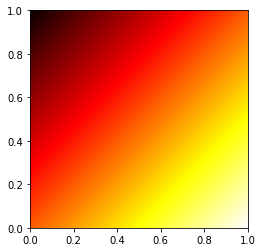

In [ ]:
fig, ax = plt.subplots()

x = np.arange(10, 20, 0.01)

def animate(i):
  heatmap = np.zeros((x.shape[0], x.shape[0]))
  for j, val_j in enumerate(x):
    for k, val_k in enumerate(x):
      # heatmap[j,k] = params_hist[i][0]*val_j + params_hist[i][1]*val_k
      heatmap[j,k] = coef_hist_cd[i][0]*val_j + coef_hist_cd[i][1]*val_k + intercept_hist_cd[i]
      # budgets = np.array([val_j, val_k])
      # heatmap[j,k] = budgets.T @ coef_hist[i] + intercept_hist[i]
  
  
  im = ax.imshow(heatmap, cmap='hot', interpolation='nearest', extent = [0 , 1, 0 , 1])


ani = animation.FuncAnimation(fig, animate, frames=num_iters_VI, interval=500, repeat=False)

# ani.save('/content/drive/My Drive/exp_results/cd_value_fisher.gif', writer='imagemagick', fps=5)

ani

##### Leontief

NameError: ignored

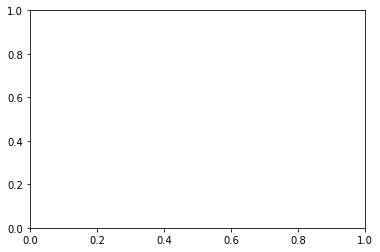

In [ ]:
# print(coef_hist)
# print(intercept_hist)

fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

def animate(i):
  heatmap = np.zeros((x.shape[0], x.shape[0]))
  for j, val_j in enumerate(x):
    for k, val_k in enumerate(x):
      # heatmap[j,k] = params_hist[i][0]*val_j + params_hist[i][1]*val_k
      heatmap[j,k] = coef_hist_leontief[i][0]*val_j + coef_hist_leontief[i][1]*val_k + intercept_hist_leontief[i]
      # budgets = np.array([val_j, val_k])
      # heatmap[j,k] = budgets.T @ coef_hist[i] + intercept_hist[i]
  
  
  im = ax.imshow(heatmap, cmap='hot', interpolation='nearest', extent = [0 , 1, 0 , 1])


ani = animation.FuncAnimation(fig, animate, frames=num_iters_VI, interval=500, repeat=False)

# ani.save('/content/drive/My Drive/exp_results/leontief_value_fisher.gif', writer='imagemagick', fps=5)

ani

#### Plots of Change in value function

In [ ]:
# values_hist_linear = np.array(values_hist_linear)
values_hist_cd = np.array(values_hist_cd)
# values_hist_leontief = np.array(values_hist_leontief)

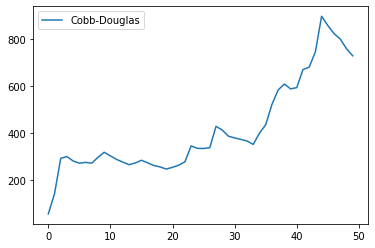

In [ ]:
# avg_values_linear = np.average(values_hist_linear, axis = 1)
avg_values_cd = np.average(values_hist_cd, axis = 1)
# avg_values_leontief = np.average(values_hist_leontief, axis = 1)

fig, ax = plt.subplots()
# ax.plot(np.arange(0, avg_values_linear.shape[0]), avg_values_linear, label = "Linear")
# ax.plot(np.arange(0, avg_values_leontief.shape[0]), avg_values_leontief, label = "Leontief")
ax.plot(np.arange(0, avg_values_cd.shape[0]), avg_values_cd, label = "Cobb-Douglas")
ax.legend()
fig.show()



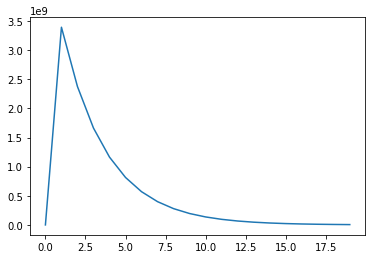

In [ ]:
plt.plot(np.arange(0, avg_values_linear.shape[0]), avg_values_linear, label = "Linear")

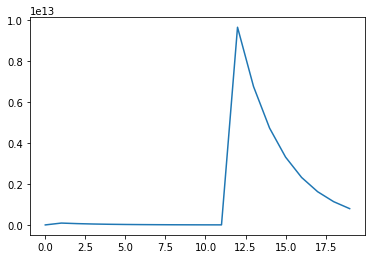

In [ ]:
plt.plot(np.arange(0, avg_values_linear.shape[0]), avg_values_leontief, label = "Leontief")

#### Distance to equilibrium

In [ ]:
def distance_between_cumul_utils(initial_budgets, valuations, utility_type, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
                                 num_iters_prices, num_iters_demands, num_iters_cumul, num_iters_single, num_samples_single):
  num_buyers = valuations.shape[0]
  num_goods = valuations.shape[1]

  # Based on VI
  start_prices, cumul_utils_VI = get_buyers_cumulative_util(initial_budgets, valuations, utility_type, 
                                                            value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                                                            num_iters_prices, num_iters_demands, num_iters_cumul)
  
  # Single buyer
  slopes = np.array([2, -1, 4])
  intercepts = np.array([2, -1, 4])
  cumul_utils_single = []
  for buyer in range(num_buyers):
    valuation = valuations[buyer]
    initial_budget = initial_budgets[buyer]
    optimal_value_slopes, optimal_value_intercepts = get_optimal_value_function_singlebuyer(valuation, start_prices, discount, slopes, 
                                                                                            intercepts, num_iters_single, num_samples_single, 
                                                                                            utility_type)
    print("value:", np.min(optimal_value_slopes * initial_budget + optimal_value_intercepts))
    cumul_utils_single.append(np.min(optimal_value_slopes * initial_budget + optimal_value_intercepts))

  print(cumul_utils_VI)
  print(cumul_utils_single)
  print(np.linalg.norm(cumul_utils_VI - cumul_utils_single))
  return np.linalg.norm(cumul_utils_VI - cumul_utils_single)

In [ ]:
num_goods = 3
num_buyers = 2
discount = 0.9
value_coef = coef_hist_cd[-1]
# value_coef = np.repeat(0.5, num_buyers)
value_intercept = intercept_hist_cd[-1]
initial_budgets = np.random.uniform(10, 20, num_buyers)
learn_rate_prices = 1.2
learn_rate_demands = 1.4
num_iters_prices = 80 #10
num_iters_demands = 50 #20
utility_type = "cd"

value, prices, allocations, savings = min_max_linear_value(initial_budgets, valuations, value_coef, value_intercept, 
                                                           discount, learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, utility_type)
print(initial_budgets)
print(savings)
value, prices, allocations, savings = min_max_linear_value(savings, valuations, value_coef, value_intercept, 
                                                           discount, learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, utility_type)

valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[1.00000000e-04 1.00000000e-04 2.39085631e-01]
 [2.38380879e-01 1.00000000e-04 1.00000000e-04]]
Prices:
 [46.72214007 63.60080478 47.55444493]
actual spending
 [11.38061675 11.14878033]
spending
 [11.59910784 11.36682923]
[11.59920784 11.36692923]
[0.0001 0.0001]
valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[0.0001 0.0001 0.0001]
 [0.0001 0.0001 0.0001]]
Prices:
 [0.001 0.001 0.001]
actual spending
 [3.e-07 3.e-07]
spending
 [0. 0.]


In [ ]:
error_count = 0
num_goods = 3
num_buyers = 2
discount = 0.9
value_coef = coef_hist_cd[-1]
# value_coef = np.repeat(0.5, num_buyers)
value_intercept = intercept_hist_cd[-1]
# value_intercept = 10
print(value_coef, value_intercept)


valuations = np.random.uniform(30,40, (num_buyers, num_goods))
initial_budgets = np.random.uniform(10, 20, num_buyers)
learn_rate_prices = 1.2
learn_rate_demands = 1.4
num_iters_prices = 80 #10
num_iters_demands = 50 #20
num_iters_cumul = 50

num_iters_single = 20
num_samples_single = 100
num_segments_single = 3
utility_type = "cd"

distance = distance_between_cumul_utils(initial_budgets, valuations, utility_type, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                                 num_iters_prices, num_iters_demands, num_iters_cumul, num_iters_single, num_samples_single)

[-10.07120871 -13.84543061] 545.3589043313551
valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[1.00000000e-04 1.00000000e-04 1.45729192e-01]
 [1.56134710e-01 1.00000000e-04 1.00000000e-04]]
Prices:
 [117.93858398 156.43990946 120.07786228]
actual spending
 [17.52628765 18.44195841]
spending
 [17.67588201 18.60026986]
valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[0.0001 0.0001 0.0001]
 [0.0001 0.0001 0.0001]]
Prices:
 [0.001 0.001 0.001]
actual spending
 [3.e-07 3.e-07]
spending
 [0. 0.]
valuati

KeyboardInterrupt: ignored

## Heuristic Based Solution


#### Min_max step

In [ ]:

def min_max_linear_value(budgets, valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                         num_iters_prices, num_iters_demands, utility_type):
  prices = np.zeros(valuations.shape[1]).clip(min=1/np.sum(budgets))
  print(f"valuations: {valuations}")
 
  num_buyers = budgets.shape[0]
  num_goods = prices.shape[0]
  
 
  if utility_type == "linear":
      get_util = get_linear_util
      get_marginal_util = get_linear_util_gradient
      get_obj = get_linear_obj


  elif utility_type == "leontief":
      get_util = get_leontief_util
      get_marginal_util = get_leontief_util_gradient
      get_obj = get_leontief_obj
      

  elif utility_type == "cd":
      get_util = get_cd_util
      get_marginal_util = get_cd_util_gradient
      get_obj = get_cd_obj

  allocation = cp.Variable((num_buyers, num_goods))
  saving = cp.Variable(num_buyers)
  p = cp.Parameter(num_goods)
  beta = cp.Parameter(num_buyers) 
  X = cp.Parameter((num_buyers, num_goods))

  obj = cp.Minimize( cp.sum(cp.power(cp.norm(X - allocation, axis = 1), 2)) + cp.sum(cp.power(saving - beta, 2)))
  constr = [allocation @ p  + saving <= budgets,
              allocation >= 0,
              saving >= 0] 
  
  # Gradient Descent loop
  for iter_outer in range(1, num_iters_prices):
    # get_global(X, get_obj, prices, budgets, valuations, value_coef, value_intercept)
    ranges = tuple((0.01, np.max(budgets)/np.min(prices).clip(min = 0.01)) for i in range(num_buyers*(num_goods+1)))
    # print(ranges)
    
    resbrute = sp.optimize.dual_annealing(get_global, ranges, args = (get_obj, prices, budgets, valuations, value_coef, value_intercept))
    results = resbrute.x.reshape((valuations.shape[0], valuations.shape[1] + 1))
    demands = results[:, :-1]
    savings = results[:, -1]

    demands = demands.clip(min = 0.0001)
    savings = savings.clip(min = 0.0001)
    # Projection step
    p.value = prices
    beta.value = savings
    X.value = demands

    problem = cp.Problem(obj, constr)
    problem.solve(warm_start=True)
    # print("problem status", problem.status)
    demands, savings = allocation.value, saving.value
    print("demands brute", demands)
    print("savings", savings)

    excess_demands = np.sum(demands, axis = 0) - np.ones(num_goods)
    if np.linalg.norm(excess_demands)**2 < 10e-2:
      print("Early end! Excess demand norm:", np.linalg.norm(excess_demands)**2)
      break
    prices += (iter_outer**(-1/2))*learn_rate_prices*excess_demands/np.linalg.norm(excess_demands)
    # prices /= np.sum(budgets - savings)  
    prices = np.clip(prices, a_min=0.000001, a_max = None)

    if not(iter_outer % 1):
      print(f"\n**Min-Max Price Iteration {iter_outer}**")
      print(f"Prices:\n {prices}")
      print(f"Excess Demands\n {excess_demands}")
      print(f"actual spending\n {demands @ prices}")
      print(f"spending\n {budgets - savings}")
  
  print(f"Prices:\n {prices}")
  print(f"Excess Demands\n {excess_demands}")
  print(f"Savings:\n {savings}")
  print(f"actual spending\n {demands @ prices}")
  print(f"spending\n {budgets - savings}")
  
  value = get_obj(prices, demands, budgets-savings, valuations) + discount*(savings.T @ value_coef + value_intercept)
  return value, prices, demands, savings

#### Value Iteration

In [ ]:

# The main function for value iteration
def fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
                                                                    num_iters_VI, num_iters_prices,  num_iters_demands, 
                                                                    num_samples, utility_type):
    coef_hist = [value_coef]
    intercept_hist = [value_intercept]
    values_hist = []
    budgets_hist = []
    
    num_buyers = valuations.shape[0]
    num_goods = valuations.shape[1]

    budgets_samples = np.random.uniform(0, 1, (num_samples, num_buyers))
    for iter in range(num_iters_VI):
        print(f"----------Iteration {iter}------------")
        values = []
        
        for index, budgets in enumerate(budgets_samples): 
            print(f"_____Sample {index}_____")
            value, prices, allocations, savings = min_max_linear_value(budgets, valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, utility_type)
            values.append(value)
        
        values = np.array(values)
        

        reg = linear_model.LinearRegression()
        reg.fit(budgets_samples, values)
        value_coef = reg.coef_ # Update the parameters
        value_intercept = reg.intercept_ # Update the intercept
        
        coef_hist.append(value_coef)
        intercept_hist.append(value_intercept)
        values_hist.append(values)
        budgets_hist.append(budgets_samples)

        # coef_hist_filename = f"/content/drive/My Drive/exp_results/coef_hist_{iter}_cd_fisher.npy"
        # intercept_hist_filename = f"/content/drive/My Drive/exp_results/intercept_hist_{iter}_cd_fisher.npy"
        # values_hist_filename = f"/content/drive/My Drive/exp_results/values_hist_{iter}_cd_fisher.npy"
        # budgets_hist_filename = f"/content/drive/My Drive/exp_results/budgets_hist_{iter}_cd_fisher.npy"
        # with open(coef_hist_filename, 'wb') as f:
        #     np.save(f, coef_hist)

        # with open(intercept_hist_filename, 'wb') as f:
        #     np.save(f, intercept_hist)

        # with open(values_hist_filename, 'wb') as f:
        #     np.save(f, values_hist)


        # with open(budgets_hist_filename, 'wb') as f:
        #     np.save(f, budgets_hist)

    return (coef_hist, intercept_hist, values_hist, budgets_hist)


### Experiments

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

num_goods = 5
num_buyers = 2
discount = 0.9
value_coef = np.repeat(1, num_buyers)
value_intercept = 10


valuations = np.random.uniform(50,10, (num_buyers, num_goods))

learn_rate_prices = 0.5
learn_rate_demands = 0.8
num_iters_VI = 20
num_iters_prices = 30 #10
num_iters_demands = 100 #20
num_samples = 25 #25



coef_hist_linear, intercept_hist_linear, values_hist_linear, budgets_hist_linear = fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
                                                                    num_iters_VI, num_iters_prices, num_iters_demands, 
                                                                    num_samples, "linear")

##### Save Linear data ##### 

with open('/content/drive/My Drive/exp_results/coef_hist_linear_fisher_heuristic.npy', 'wb') as f:
    np.save(f, coef_hist_linear)

with open('/content/drive/My Drive/exp_results/intercept_hist_linear_fisher_heuristic.npy', 'wb') as f:
    np.save(f, intercept_hist_linear)

with open('/content/drive/My Drive/exp_results/values_hist_linear_fisher_heuristic.npy', 'wb') as f:
    np.save(f, values_hist_linear)

with open('/content/drive/My Drive/exp_results/budgets_hist_linear_fisher_heuristic.npy', 'wb') as f:
    np.save(f, budgets_hist_linear)



    
coef_hist_leontief, intercept_hist_leontief, values_hist_leontief, budgets_hist_leontief = fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
                                                                    num_iters_VI, num_iters_prices, num_iters_demands, 
                                                                    num_samples, "leontief")


##### Save Cobb-Douglas data #####
with open('/content/drive/My Drive/exp_results_cd/coef_hist_cd_fisher_heuristic.npy', 'wb') as f:
    np.save(f, coef_hist_cd)

with open('/content/drive/My Drive/exp_results_cd/intercept_hist_cd_fisher_heuristic.npy', 'wb') as f:
    np.save(f, intercept_hist_cd)

with open('/content/drive/My Drive/exp_results_cd/values_hist_cd_fisher_heuristic.npy', 'wb') as f:
    np.save(f, values_hist_cd)



coef_hist_cd, intercept_hist_cd, values_hist_cd, budgets_hist_cd = fitted_linear_val_iter(valuations, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                                                                    num_iters_VI, num_iters_prices, num_iters_demands, 
                                                                    num_samples, "cd")


# ##### Save Leontief data ##### 
with open('/content/drive/My Drive/exp_results/budgets_hist_cd_fisher_heuristic.npy', 'wb') as f:
    np.save(f, budgets_hist_cd)

with open('/content/drive/My Drive/exp_results/coef_hist_leontief_fisher_heuristic.npy', 'wb') as f:
    np.save(f, coef_hist_leontief)

with open('/content/drive/My Drive/exp_results/intercept_hist_leontief_fisher_heuristic.npy', 'wb') as f:
    np.save(f, intercept_hist_leontief)

with open('/content/drive/My Drive/exp_results/values_hist_leontief_fisher_heuristic.npy', 'wb') as f:
    np.save(f, values_hist_leontief)

with open('/content/drive/My Drive/exp_results/budgets_hist_leontief_fisher_heuristic.npy', 'wb') as f:
    np.save(f, budgets_hist_leontief)


Streaming output truncated to the last 5000 lines.
actual spending
 [0.78073249 0.64967062]
spending
 [0.55964318 0.46569565]
demands brute [[0.47010237 0.47010237 0.47010237 0.47010237 0.47024097]
 [0.39118028 0.39118028 0.39118028 0.39118028 0.3913247 ]]
savings [-1.05053160e-10 -1.53130116e-10]
Early end! Excess demand norm: 0.0961340794561196
Prices:
 [0.23808364 0.23808364 0.23808364 0.23808364 0.2380661 ]
Excess Demands
 [-0.13871735 -0.13871735 -0.13871735 -0.13871735 -0.13843433]
Savings:
 [-1.05053160e-10 -1.53130116e-10]
actual spending
 [0.55964317 0.46569565]
spending
 [0.55964317 0.46569565]
_____Sample 16_____
valuations: [[16.39835298 36.48024463 33.86962402 41.815944   34.71072127]
 [23.11278209 36.04225456 26.13841188 33.52615691 12.17844673]]
demands brute [[0.00218128 0.00218128 0.00218128 0.00218128 0.00218128]
 [0.0059516  0.0059516  0.0059516  0.0059516  0.0059516 ]]
savings [0.00256602 0.02961384]

**Min-Max Price Iteration 1**
Prices:
 [4.35546167 4.35546167 4.3

#### Save results

In [ ]:
from google.colab import drive
drive.mount('/content/drive')





#### Animations of Change in Value Function

##### Linear

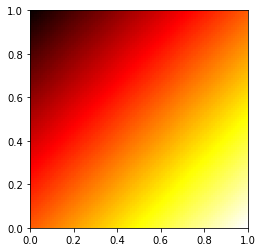

In [ ]:
# print(coef_hist)
# print(intercept_hist)

fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

def animate(i):
  heatmap = np.zeros((x.shape[0], x.shape[0]))
  for j, val_j in enumerate(x):
    for k, val_k in enumerate(x):
      # heatmap[j,k] = params_hist[i][0]*val_j + params_hist[i][1]*val_k
      heatmap[j,k] = coef_hist_linear[i][0]*val_j + coef_hist_linear[i][1]*val_k + intercept_hist_linear[i]
      # budgets = np.array([val_j, val_k])
      # heatmap[j,k] = budgets.T @ coef_hist[i] + intercept_hist[i]
  
  
  im = ax.imshow(heatmap, cmap='hot', interpolation='nearest', extent = [0 , 1, 0 , 1])


ani = animation.FuncAnimation(fig, animate, frames=num_iters_VI, interval=500, repeat=False)

# ani.save('/content/drive/My Drive/exp_results/linear_value_fisher.gif', writer='imagemagick', fps=5)

ani

##### Cobb-Douglas

In [ ]:
for i in range(num_iters_VI):
  print(coef_hist_cd[i][0]*14.141 + coef_hist_cd[i][1]*11 + intercept_hist_cd[i])



35.141
14.625986364365133
-38.601315253003946
93.91290786864369
157.1776966627855
119.71009166780959
118.04288284003871
119.62927142041758
135.03480287426237
164.70620316506947
161.00048352258113
149.48442662168338
128.78954857091935
120.06814606391242
107.6740380253641
82.45024377270505
124.24377710094302
122.02591433730319
96.18792539820129
100.8318812070321
89.81158360160504
64.94289651997377
115.4105779760965
130.44347401105637
251.28792195902628
142.2275415403533
203.79730486865924
187.3547376877948
254.02370352503
259.75553613566206
228.65664735024563
196.9950973565895
220.97418663931535
208.53982248444504
213.3813965344566
254.89626899931469
259.821247723834
373.77326782035186
408.16071849354404
404.6535180144137
442.2307417052346
423.19736915331396
527.0409458351783
493.38494464614917
535.2664265301185
723.8419426409532
677.14885714403
621.2529491930784
664.769238350098
628.761344070816


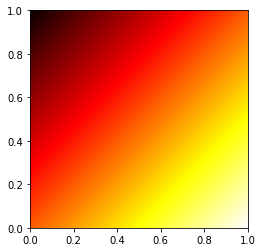

In [ ]:
fig, ax = plt.subplots()

x = np.arange(10, 20, 0.01)

def animate(i):
  heatmap = np.zeros((x.shape[0], x.shape[0]))
  for j, val_j in enumerate(x):
    for k, val_k in enumerate(x):
      # heatmap[j,k] = params_hist[i][0]*val_j + params_hist[i][1]*val_k
      heatmap[j,k] = coef_hist_cd[i][0]*val_j + coef_hist_cd[i][1]*val_k + intercept_hist_cd[i]
      # budgets = np.array([val_j, val_k])
      # heatmap[j,k] = budgets.T @ coef_hist[i] + intercept_hist[i]
  
  
  im = ax.imshow(heatmap, cmap='hot', interpolation='nearest', extent = [0 , 1, 0 , 1])


ani = animation.FuncAnimation(fig, animate, frames=num_iters_VI, interval=500, repeat=False)

# ani.save('/content/drive/My Drive/exp_results/cd_value_fisher.gif', writer='imagemagick', fps=5)

ani

##### Leontief

NameError: ignored

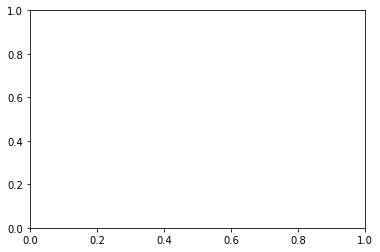

In [ ]:
# print(coef_hist)
# print(intercept_hist)

fig, ax = plt.subplots()

x = np.arange(0, 1, 0.01)

def animate(i):
  heatmap = np.zeros((x.shape[0], x.shape[0]))
  for j, val_j in enumerate(x):
    for k, val_k in enumerate(x):
      # heatmap[j,k] = params_hist[i][0]*val_j + params_hist[i][1]*val_k
      heatmap[j,k] = coef_hist_leontief[i][0]*val_j + coef_hist_leontief[i][1]*val_k + intercept_hist_leontief[i]
      # budgets = np.array([val_j, val_k])
      # heatmap[j,k] = budgets.T @ coef_hist[i] + intercept_hist[i]
  
  
  im = ax.imshow(heatmap, cmap='hot', interpolation='nearest', extent = [0 , 1, 0 , 1])


ani = animation.FuncAnimation(fig, animate, frames=num_iters_VI, interval=500, repeat=False)

# ani.save('/content/drive/My Drive/exp_results/leontief_value_fisher.gif', writer='imagemagick', fps=5)

ani

#### Plots of Change in value function

In [ ]:
# values_hist_linear = np.array(values_hist_linear)
values_hist_cd = np.array(values_hist_cd)
# values_hist_leontief = np.array(values_hist_leontief)

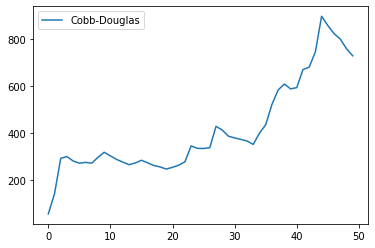

In [ ]:
# avg_values_linear = np.average(values_hist_linear, axis = 1)
avg_values_cd = np.average(values_hist_cd, axis = 1)
# avg_values_leontief = np.average(values_hist_leontief, axis = 1)

fig, ax = plt.subplots()
# ax.plot(np.arange(0, avg_values_linear.shape[0]), avg_values_linear, label = "Linear")
# ax.plot(np.arange(0, avg_values_leontief.shape[0]), avg_values_leontief, label = "Leontief")
ax.plot(np.arange(0, avg_values_cd.shape[0]), avg_values_cd, label = "Cobb-Douglas")
ax.legend()
fig.show()



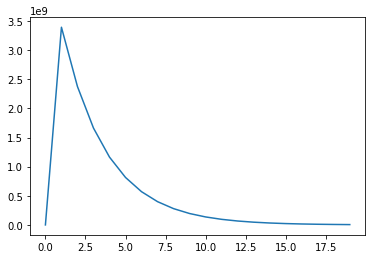

In [ ]:
plt.plot(np.arange(0, avg_values_linear.shape[0]), avg_values_linear, label = "Linear")

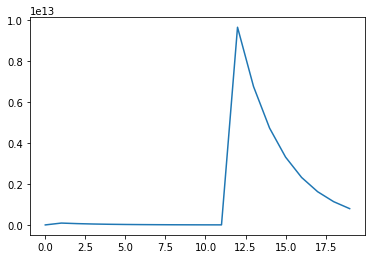

In [ ]:
plt.plot(np.arange(0, avg_values_linear.shape[0]), avg_values_leontief, label = "Leontief")

#### Distance to equilibrium

In [ ]:
def distance_between_cumul_utils(initial_budgets, valuations, utility_type, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands,
                                 num_iters_prices, num_iters_demands, num_iters_cumul, num_iters_single, num_samples_single):
  num_buyers = valuations.shape[0]
  num_goods = valuations.shape[1]

  # Based on VI
  start_prices, cumul_utils_VI = get_buyers_cumulative_util(initial_budgets, valuations, utility_type, 
                                                            value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                                                            num_iters_prices, num_iters_demands, num_iters_cumul)
  
  # Single buyer
  slopes = np.array([2, -1, 4])
  intercepts = np.array([2, -1, 4])
  cumul_utils_single = []
  for buyer in range(num_buyers):
    valuation = valuations[buyer]
    initial_budget = initial_budgets[buyer]
    optimal_value_slopes, optimal_value_intercepts = get_optimal_value_function_singlebuyer(valuation, start_prices, discount, slopes, 
                                                                                            intercepts, num_iters_single, num_samples_single, 
                                                                                            utility_type)
    print("value:", np.min(optimal_value_slopes * initial_budget + optimal_value_intercepts))
    cumul_utils_single.append(np.min(optimal_value_slopes * initial_budget + optimal_value_intercepts))

  print(cumul_utils_VI)
  print(cumul_utils_single)
  print(np.linalg.norm(cumul_utils_VI - cumul_utils_single))
  return np.linalg.norm(cumul_utils_VI - cumul_utils_single)

In [ ]:
num_goods = 3
num_buyers = 2
discount = 0.9
value_coef = coef_hist_cd[-1]
# value_coef = np.repeat(0.5, num_buyers)
value_intercept = intercept_hist_cd[-1]
initial_budgets = np.random.uniform(10, 20, num_buyers)
learn_rate_prices = 1.2
learn_rate_demands = 1.4
num_iters_prices = 80 #10
num_iters_demands = 50 #20
utility_type = "cd"

value, prices, allocations, savings = min_max_linear_value(initial_budgets, valuations, value_coef, value_intercept, 
                                                           discount, learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, utility_type)
print(initial_budgets)
print(savings)
value, prices, allocations, savings = min_max_linear_value(savings, valuations, value_coef, value_intercept, 
                                                           discount, learn_rate_prices, learn_rate_demands, num_iters_prices, num_iters_demands, utility_type)

valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[1.00000000e-04 1.00000000e-04 2.39085631e-01]
 [2.38380879e-01 1.00000000e-04 1.00000000e-04]]
Prices:
 [46.72214007 63.60080478 47.55444493]
actual spending
 [11.38061675 11.14878033]
spending
 [11.59910784 11.36682923]
[11.59920784 11.36692923]
[0.0001 0.0001]
valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[0.0001 0.0001 0.0001]
 [0.0001 0.0001 0.0001]]
Prices:
 [0.001 0.001 0.001]
actual spending
 [3.e-07 3.e-07]
spending
 [0. 0.]


In [ ]:
error_count = 0
num_goods = 3
num_buyers = 2
discount = 0.9
value_coef = coef_hist_cd[-1]
# value_coef = np.repeat(0.5, num_buyers)
value_intercept = intercept_hist_cd[-1]
# value_intercept = 10
print(value_coef, value_intercept)


valuations = np.random.uniform(30,40, (num_buyers, num_goods))
initial_budgets = np.random.uniform(10, 20, num_buyers)
learn_rate_prices = 1.2
learn_rate_demands = 1.4
num_iters_prices = 80 #10
num_iters_demands = 50 #20
num_iters_cumul = 50

num_iters_single = 20
num_samples_single = 100
num_segments_single = 3
utility_type = "cd"

distance = distance_between_cumul_utils(initial_budgets, valuations, utility_type, value_coef, value_intercept, discount, learn_rate_prices, learn_rate_demands, 
                                 num_iters_prices, num_iters_demands, num_iters_cumul, num_iters_single, num_samples_single)

[-10.07120871 -13.84543061] 545.3589043313551
valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[1.00000000e-04 1.00000000e-04 1.45729192e-01]
 [1.56134710e-01 1.00000000e-04 1.00000000e-04]]
Prices:
 [117.93858398 156.43990946 120.07786228]
actual spending
 [17.52628765 18.44195841]
spending
 [17.67588201 18.60026986]
valuations: [[31.64047679 36.44741186 32.2289292 ]
 [31.34098252 39.91526247 31.33311243]]
Min-Max Price Iteration 10

Min-Max Price Iteration 20

Min-Max Price Iteration 30

Min-Max Price Iteration 40

Min-Max Price Iteration 50

Min-Max Price Iteration 60

Min-Max Price Iteration 70

Demands:
[[0.0001 0.0001 0.0001]
 [0.0001 0.0001 0.0001]]
Prices:
 [0.001 0.001 0.001]
actual spending
 [3.e-07 3.e-07]
spending
 [0. 0.]
valuati

KeyboardInterrupt: ignored